In [544]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
data = pd.read_csv('arquivo_geral.csv',sep=';')
data = data.sort_values('data')
#  0     1     2     3     4     5     6     7     8     9     10    11    12
# 'SC', 'MS', 'RO', 'SP', 'MG', 'MT', 'RJ', 'PR', 'PI', 'PA', 'GO', 'BA', 'AC', 
#  13    14    15    16    17    18    19    20    21    22    23    24    25    26
# 'PE', 'AL', 'MA', 'TO', 'DF', 'PB', 'CE', 'RN', 'RR', 'RS', 'ES', 'AP', 'AM', 'SE'
estado = data['estado'].value_counts().index
pop = [6.7, 2.6, 1.74, 44.04, 20.87, 3.22, 16.46, 11.08, 3.19, 8.07, 6.52, 15.13,
       0.790, 9.27, 3.32, 6.85, 1.49, 2.57, 3.94, 8.84, 3.40, 0.496, 11.29, 3.88, 0.751, 3.87, 2.22]
data['casos_mi'] = 0
data['obitos_mi'] = 0
for k in range(0,len(estado)):
    data.loc[data['estado']==estado[k],'casos_mi'] = data.loc[data['estado']==estado[k],'casosAcumulados']/pop[k]
    data.loc[data['estado']==estado[k],'obitos_mi'] = data.loc[data['estado']==estado[k],'obitosAcumulados']/pop[k]

data

,regiao,estado,data,casosNovos,casosAcumulados,obitosNovos,obitosAcumulados,casos_mi,obitos_mi
0,Norte,RO,2020-01-30,0,0,0,0,0.000000,0.000000
1300,Nordeste,AL,2020-01-30,0,0,0,0,0.000000,0.000000
1400,Nordeste,SE,2020-01-30,0,0,0,0,0.000000,0.000000
2200,Sul,RS,2020-01-30,0,0,0,0,0.000000,0.000000
1800,Sudeste,RJ,2020-01-30,0,0,0,0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
1999,Sudeste,SP,2020-05-08,1902,41830,210,3416,949.818347,77.565849
699,Norte,TO,2020-05-08,71,494,0,9,331.543624,6.040268
1899,Sudeste,RJ,2020-05-08,1585,15741,109,1503,956.318348,91.312272
1799,Sudeste,ES,2020-05-08,404,4242,10,165,1093.298969,42.525773


In [545]:
dataFull = data.groupby('data').agg({'casosNovos': sum, 'casosAcumulados': sum, 'obitosNovos': sum, 'obitosAcumulados': sum})
dataFull['data'] = dataFull.index
dataFull['diasCasos'] = np.concatenate((np.zeros(len(dataFull)-len(np.arange(len(dataFull.loc[dataFull['casosAcumulados']>0])))),np.arange(len(dataFull.loc[dataFull['casosAcumulados']>0]))))
dataFull['diasObitos'] = np.concatenate((np.zeros(len(dataFull)-len(np.arange(len(dataFull.loc[dataFull['obitosAcumulados']>0])))),np.arange(len(dataFull.loc[dataFull['obitosAcumulados']>0]))))
dataFull

,casosNovos,casosAcumulados,obitosNovos,obitosAcumulados,data,diasCasos,diasObitos
data,,,,,,,
2020-01-30,0,0,0,0,2020-01-30,0.0,0.0
2020-01-31,0,0,0,0,2020-01-31,0.0,0.0
2020-02-01,0,0,0,0,2020-02-01,0.0,0.0
2020-02-02,0,0,0,0,2020-02-02,0.0,0.0
2020-02-03,0,0,0,0,2020-02-03,0.0,0.0
...,...,...,...,...,...,...,...
2020-05-04,6633,107780,296,7321,2020-05-04,68.0,48.0
2020-05-05,6935,114715,600,7921,2020-05-05,69.0,49.0
2020-05-06,10503,125218,614,8535,2020-05-06,70.0,50.0


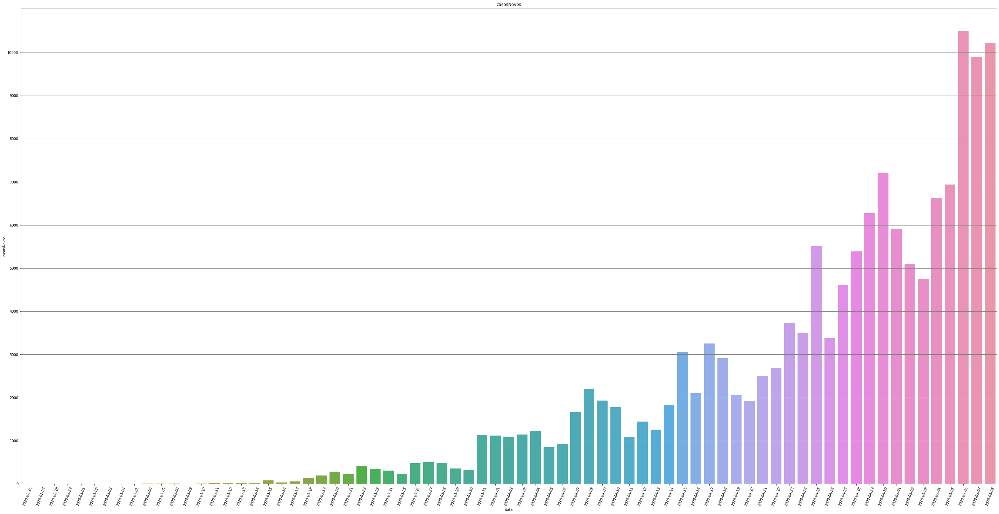

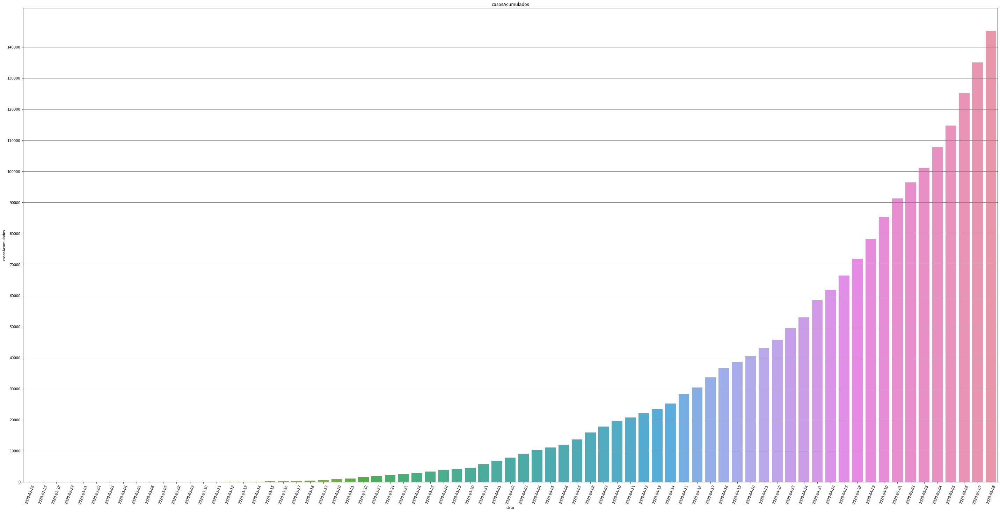

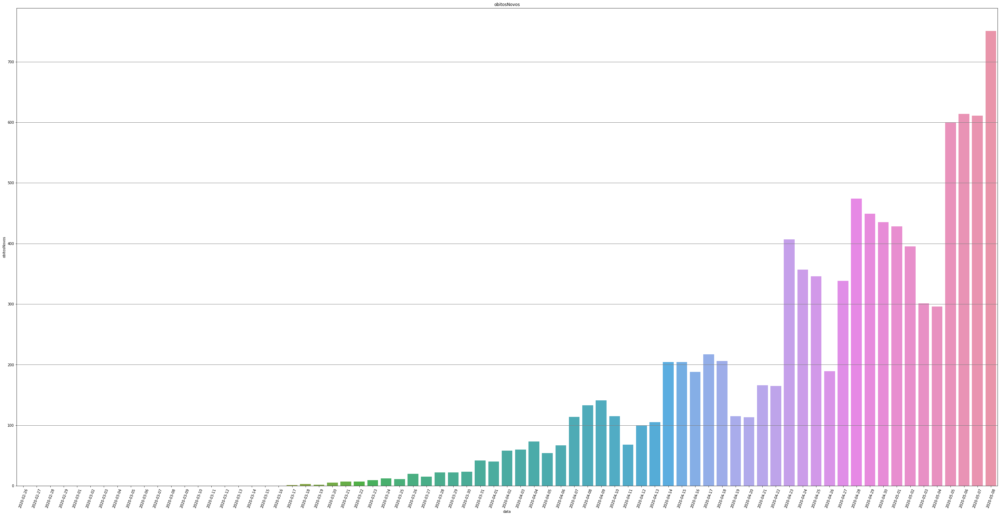

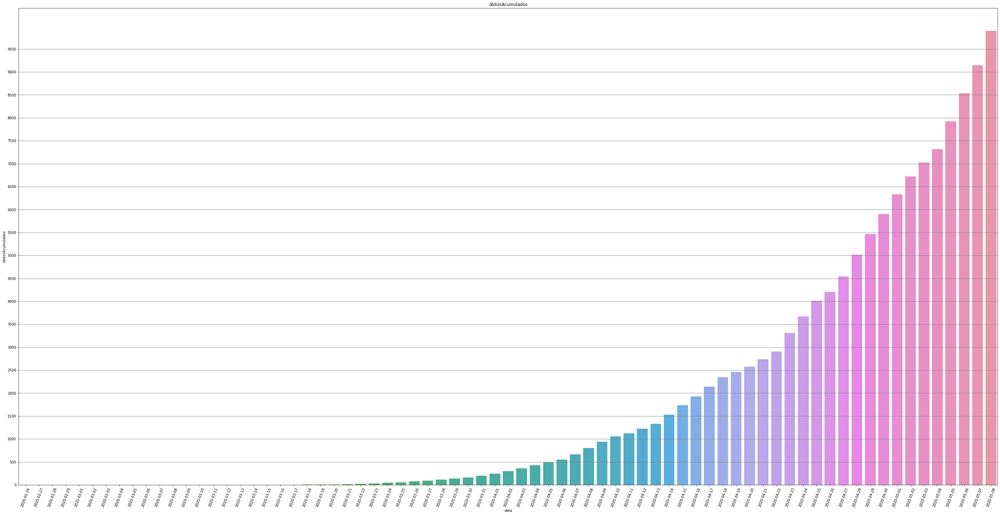

In [401]:
ticks = [1000,10000,100,500]
for i in range(0,4):
    y = dataFull.columns[i]
    plt.figure(figsize=(50,25))
    #plt.subplot(5,1,i+1)
    plt.grid(color='grey', linestyle='-', linewidth=1)
    plt.title(y)
    plt.xlabel('data')
    plt.ylabel(y)
    plt.xticks(rotation=70)
    plt.yticks(np.arange(min(dataFull[y]), max(dataFull[y]), ticks[i]))
    sns.barplot(x='data', y=y, data=dataFull.loc[dataFull['casosAcumulados']>0], linewidth=10)
    plt.savefig('graficos/brasil/'+y+'-Brasil.png')

IndexError: index 27 is out of bounds for axis 0 with size 27

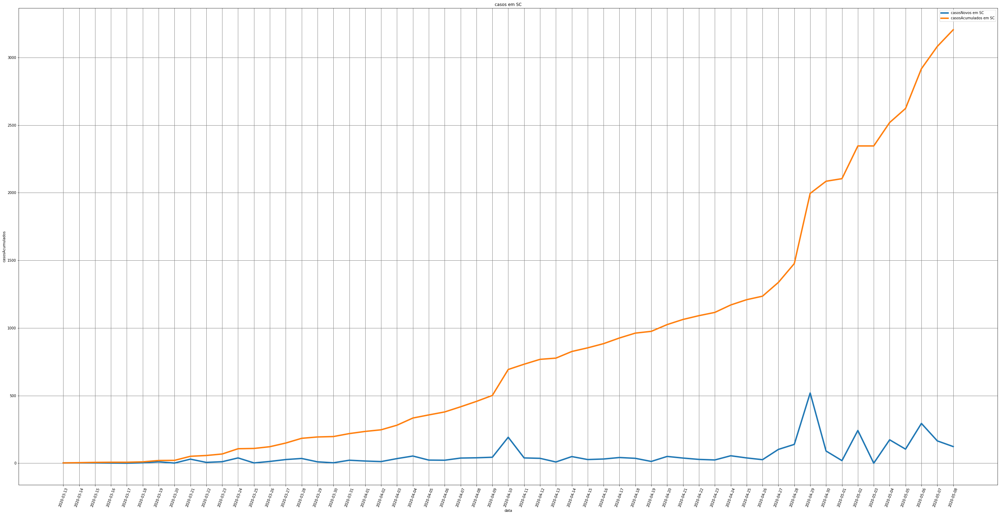

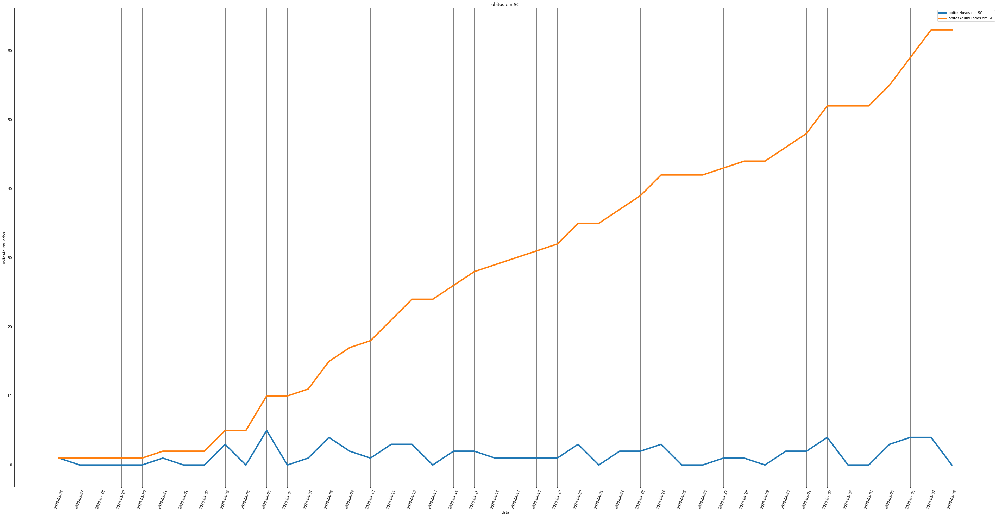

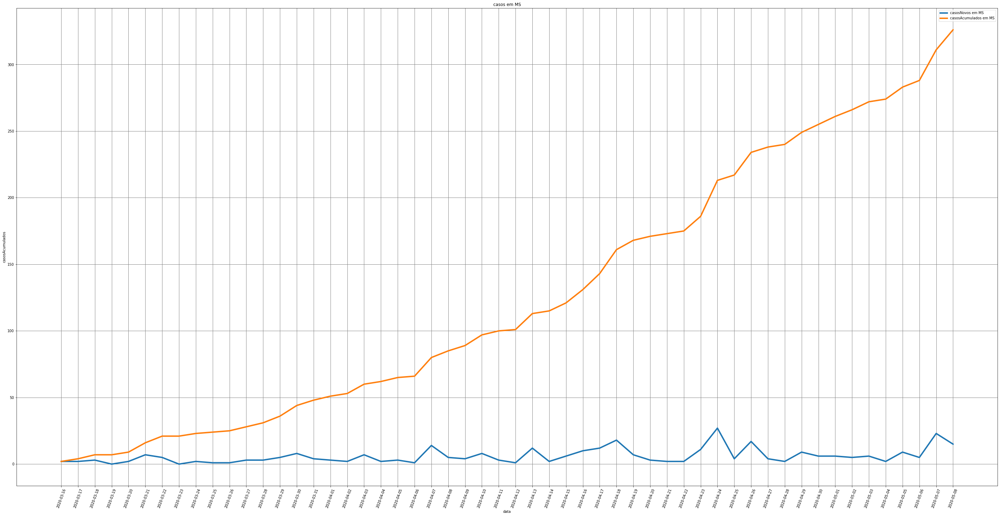

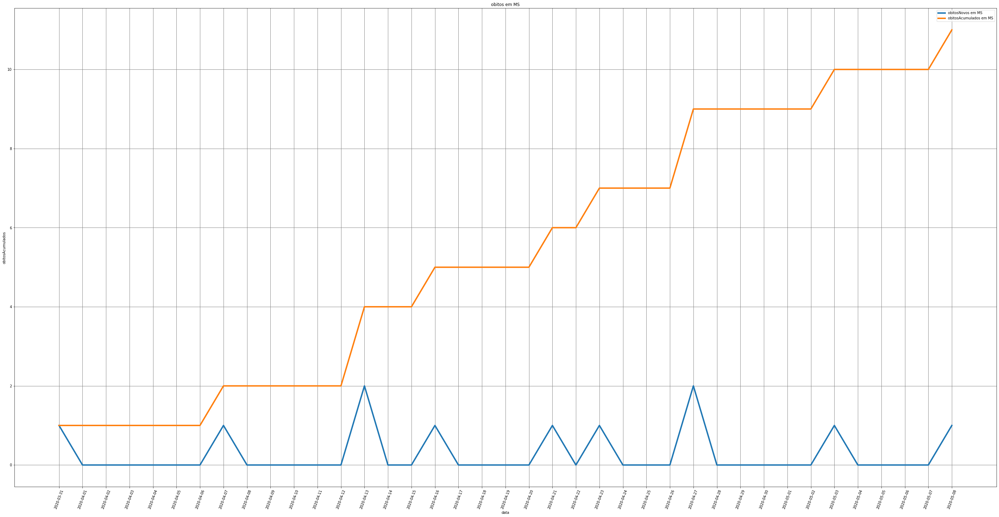

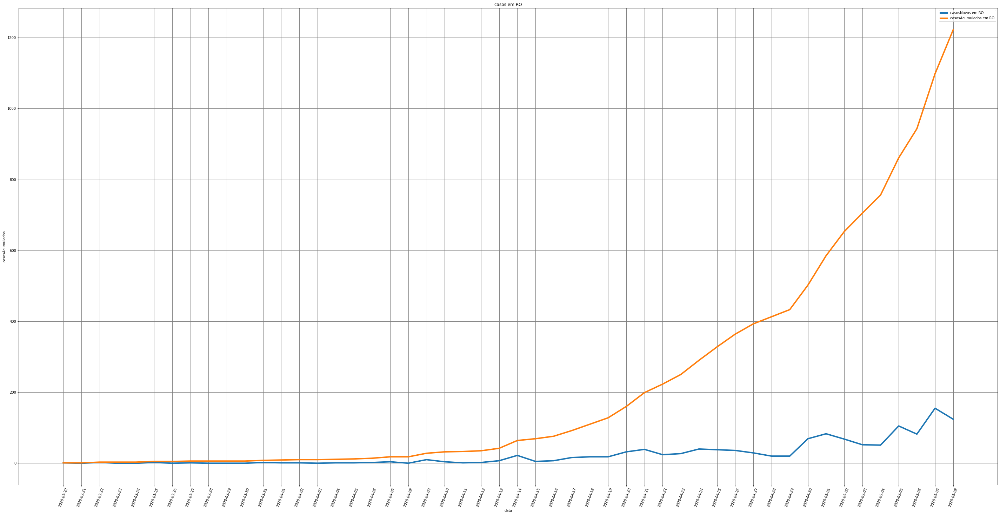

...

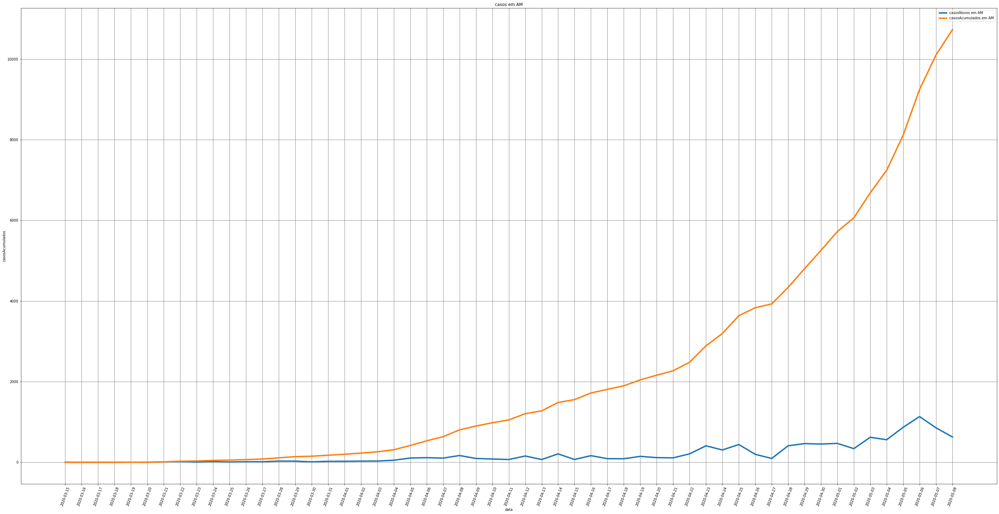

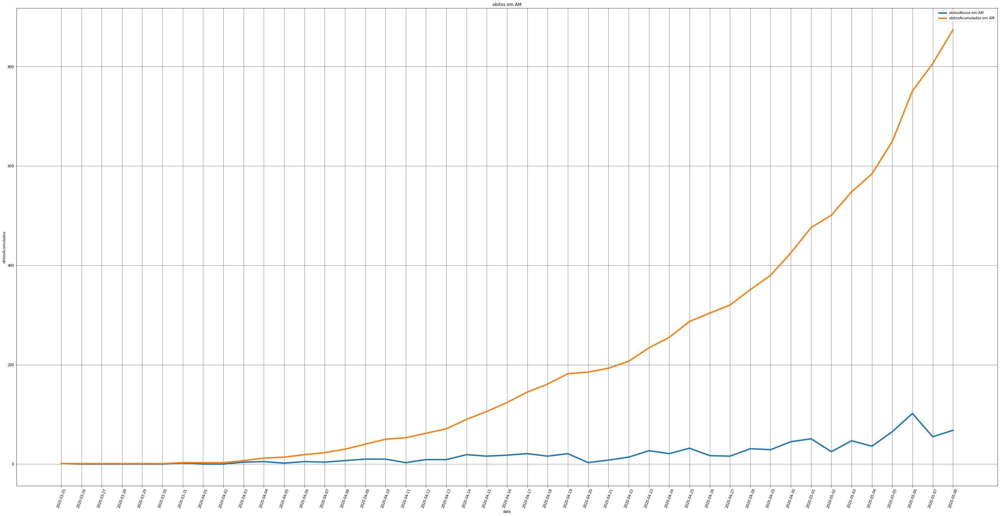

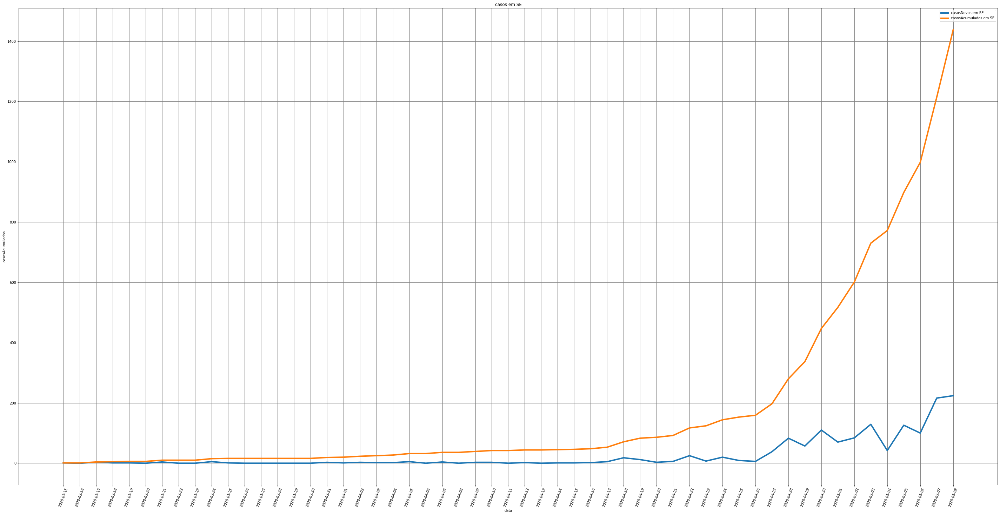

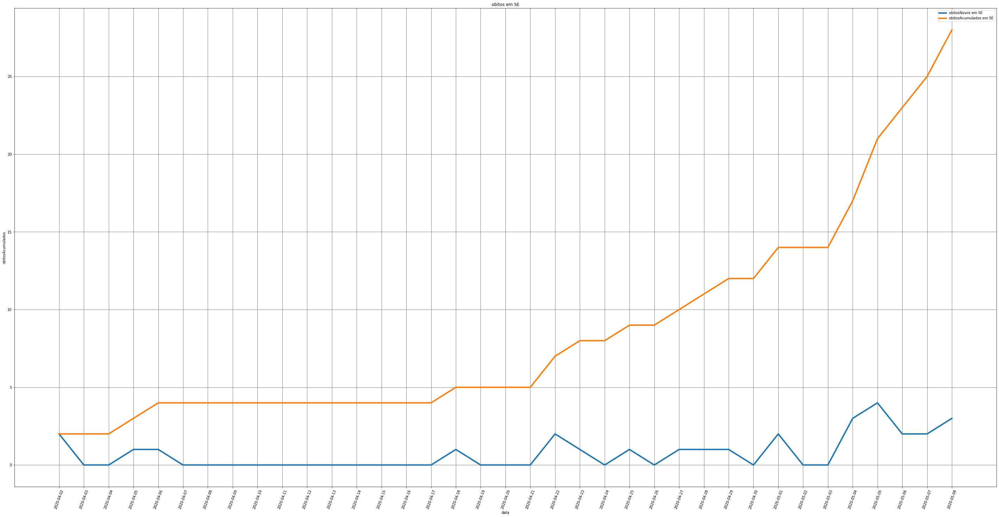

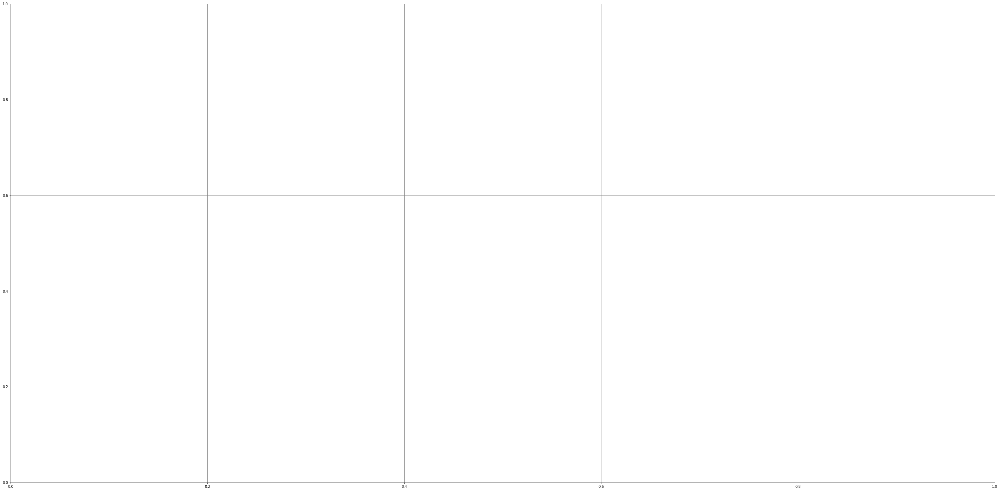

In [398]:
estado = data['estado'].value_counts().index
for j in range(0,len(estado)+1):
    l=4
    i=0
    y = dataFull.columns[i]
    plt.figure(figsize=(50,25))
    plt.grid(color='grey', linestyle='-', linewidth=1)
    plt.title('casos em '+estado[j])
    plt.xlabel('data')
    plt.ylabel('casos')
    plt.xticks(rotation=70)
    sns.lineplot(x='data', y=y, data=data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[j])], linewidth=l, label=y+' em '+estado[j])
    y=dataFull.columns[i+1]
    sns.lineplot(x='data', y=y, data=data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[j])], linewidth=l, label=y+' em '+estado[j])
    plt.savefig('graficos/estados/'+y+' em '+estado[j]+'.png')

    i=2
    j


IndexError: index 27 is out of bounds for axis 0 with size 27

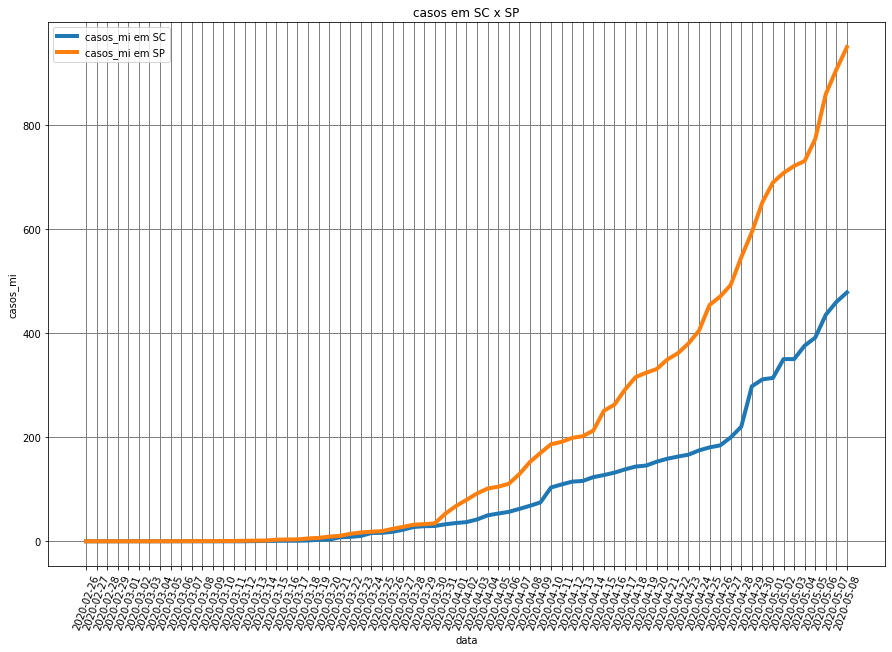

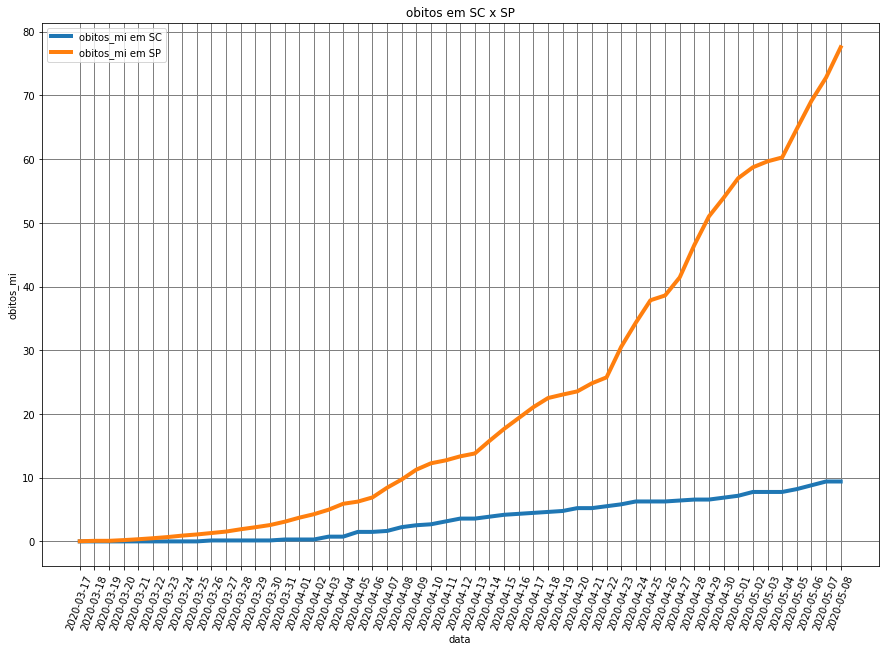

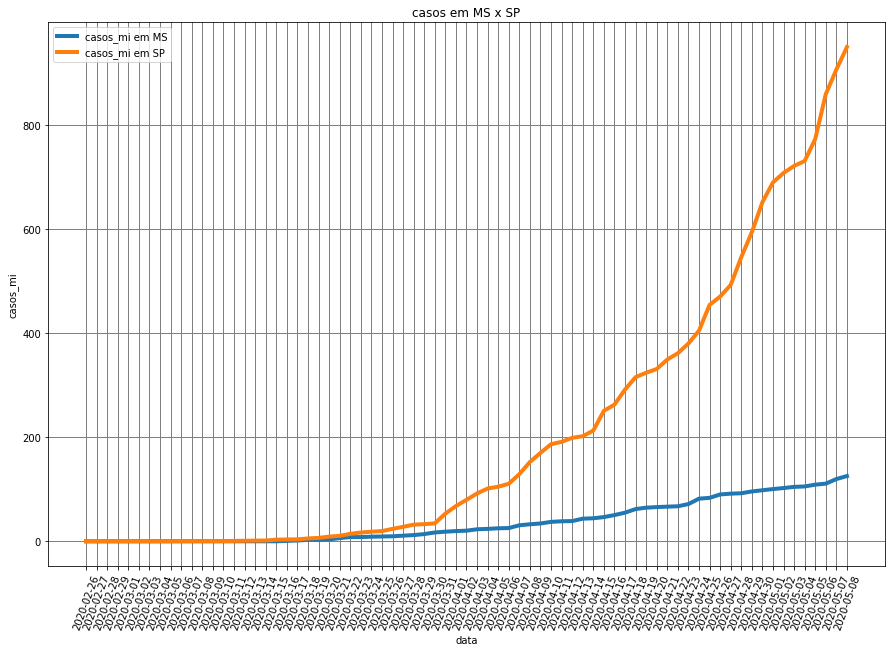

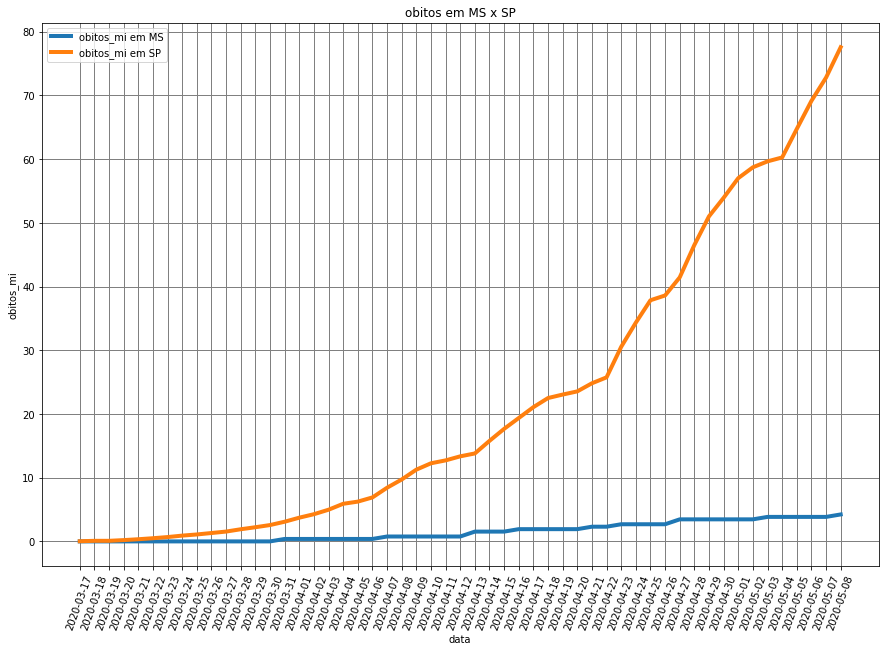

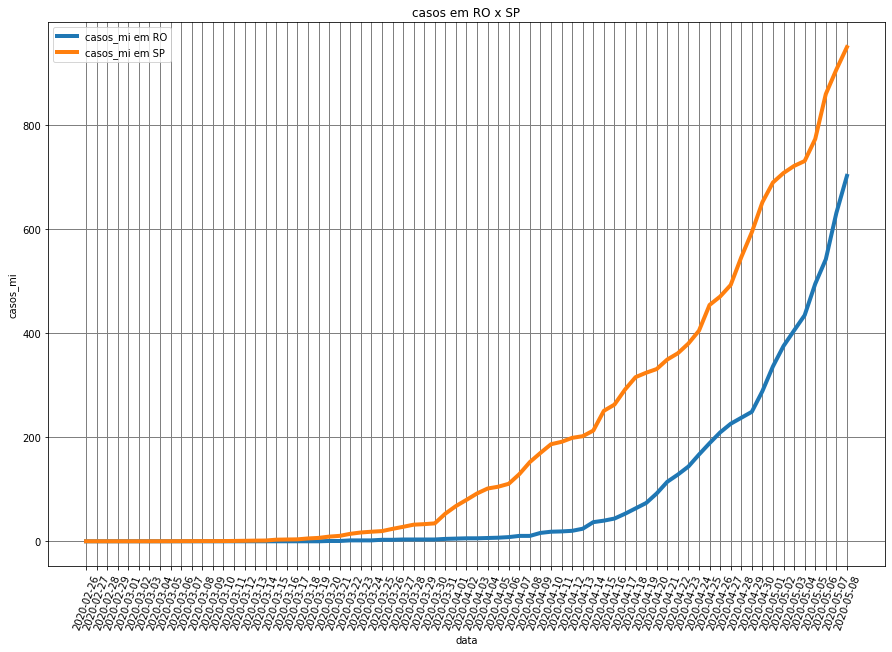

...

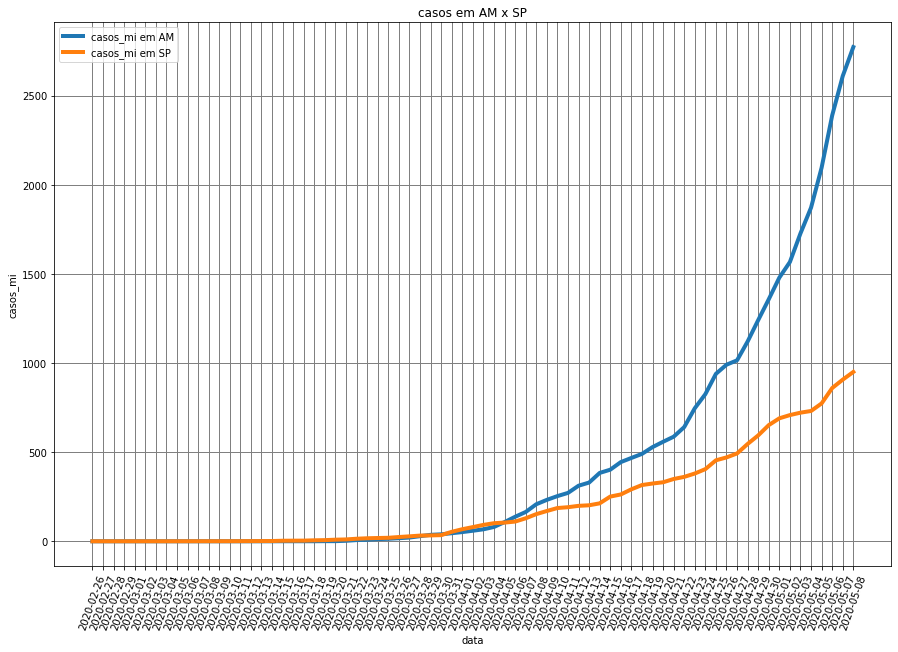

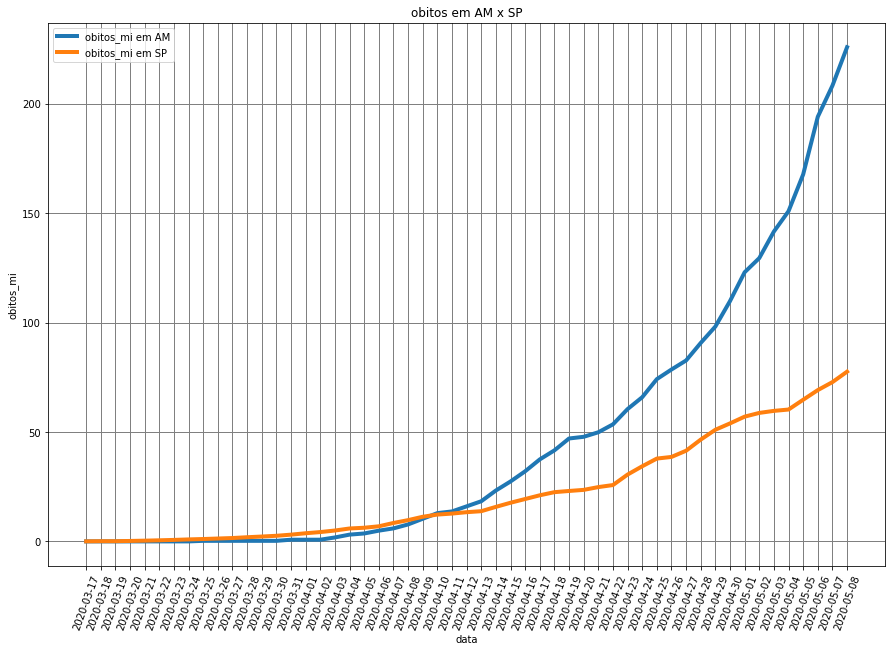

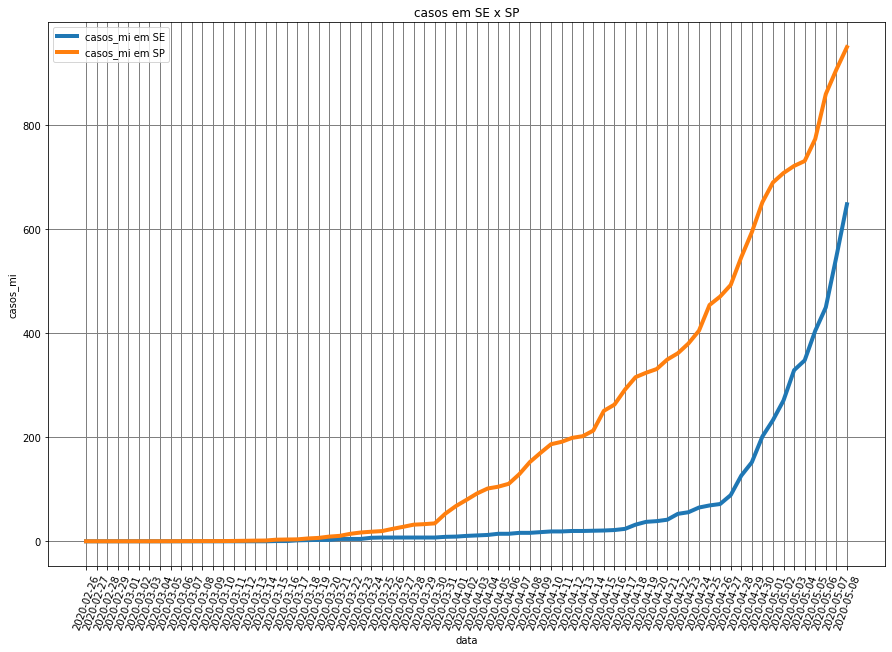

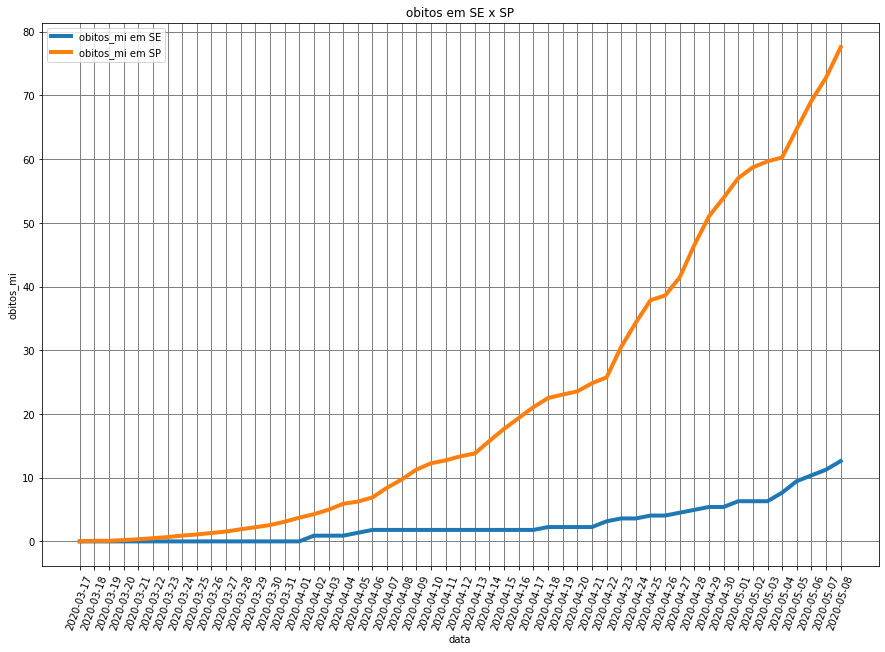

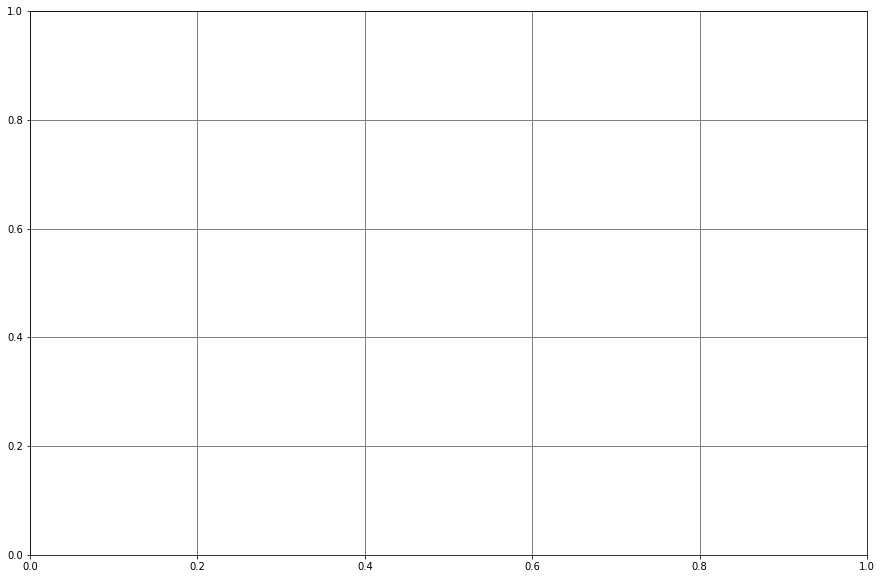

In [540]:
for s in range(0,28):
    if s!=3:
        st1, st2 = s, 3
        y = 'casos_mi'
        plt.figure(figsize=(15,10))
        plt.grid(color='grey', linestyle='-', linewidth=1)
        plt.title('casos em '+estado[st1]+' x '+estado[st2])
        plt.xlabel('data')
        plt.ylabel('casos')
        plt.xticks(rotation=70)
        sns.lineplot(x='data', y=y, data=data.loc[(data['data']>=np.sort([data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[st1]),'data'].min(),data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[st2]),'data'].min()])[0]) & (data['estado']==estado[st1])], linewidth=l, label=y+' em '+estado[st1])
        sns.lineplot(x='data', y=y, data=data.loc[(data['data']>=np.sort([data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[st1]),'data'].min(),data.loc[(data['casosAcumulados']>0) & (data['estado']==estado[st2]),'data'].min()])[0]) & (data['estado']==estado[st2])], linewidth=l, label=y+' em '+estado[st2])
        plt.savefig('graficos/SPxEstados/casos em '+estado[st1]+' x '+estado[st2]+'.png')
        
        y = 'obitos_mi'
        plt.figure(figsize=(15,10))
        plt.grid(color='grey', linestyle='-', linewidth=1)
        plt.title('obitos em '+estado[st1]+' x '+estado[st2])
        plt.xlabel('data')
        plt.ylabel('obitos')
        plt.xticks(rotation=70)
        sns.lineplot(x='data', y=y, data=data.loc[(data['data']>=np.sort([data.loc[(data['obitosAcumulados']>0) & (data['estado']==estado[st1]),'data'].min(),data.loc[(data['obitosAcumulados']>0) & (data['estado']==estado[st2]),'data'].min()])[0]) & (data['estado']==estado[st1])], linewidth=l, label=y+' em '+estado[st1])
        sns.lineplot(x='data', y=y, data=data.loc[(data['data']>=np.sort([data.loc[(data['obitosAcumulados']>0) & (data['estado']==estado[st1]),'data'].min(),data.loc[(data['obitosAcumulados']>0) & (data['estado']==estado[st2]),'data'].min()])[0]) & (data['estado']==estado[st2])], linewidth=l, label=y+' em '+estado[st2])
        plt.savefig('graficos/SPxEstados/obitos em '+estado[st1]+' x '+estado[st2]+'.png')

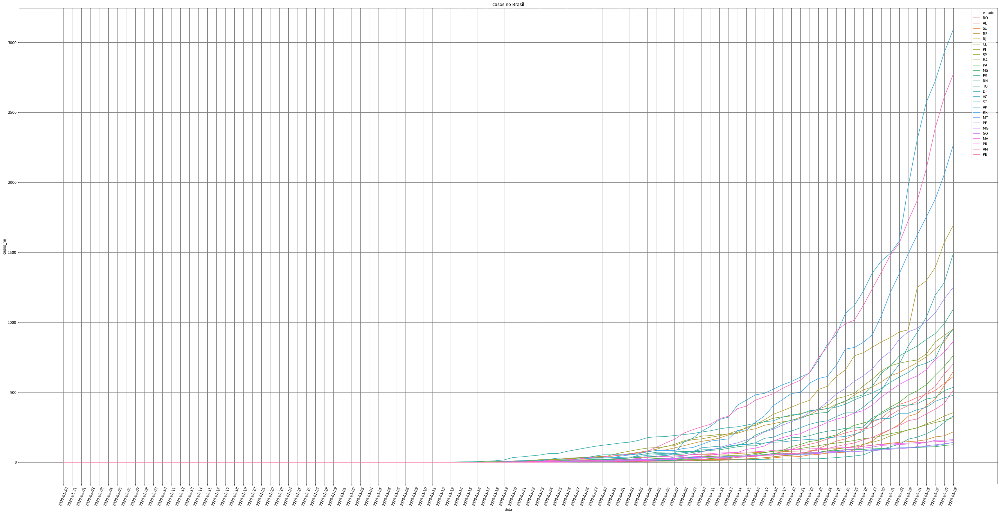

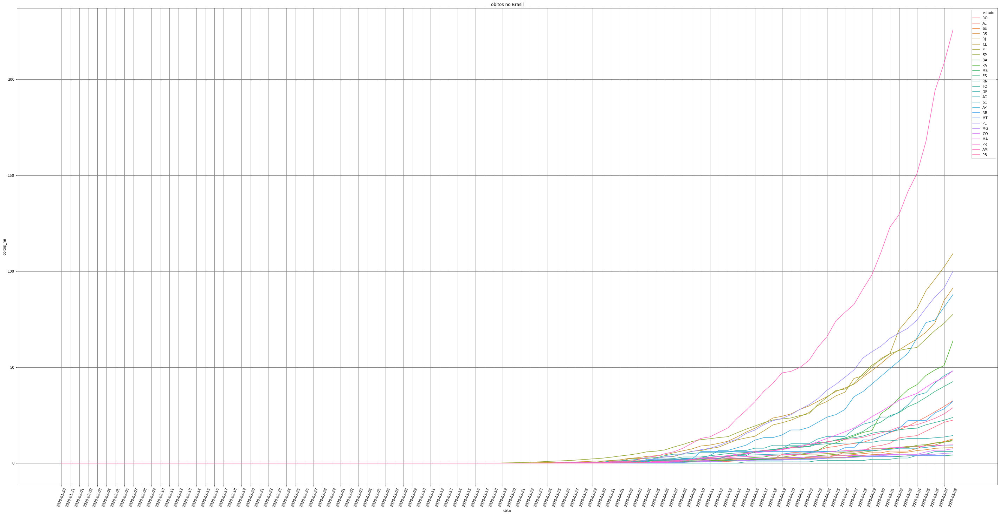

In [541]:
y = 'casos_mi'
plt.figure(figsize=(50,25))
plt.grid(color='grey', linestyle='-', linewidth=1)
plt.title('casos no Brasil')
plt.xlabel('data')
plt.ylabel('casos por milhao de população')
plt.xticks(rotation=70)
sns.lineplot(x='data', y=y, hue='estado', data=data)
plt.savefig('graficos/casos_por_mi_Estados.png')

y = 'obitos_mi'
plt.figure(figsize=(50,25))
plt.grid(color='grey', linestyle='-', linewidth=1)
plt.title('obitos no Brasil')
plt.xlabel('data')
plt.ylabel('obitos por milhao de população')
plt.xticks(rotation=70)
sns.lineplot(x='data', y=y, hue='estado', data=data)
plt.savefig('graficos/obitos_por_mi_Estados.png')

<Figure size 432x288 with 0 Axes>